In [2]:
import tensorflow as tf
import gc
tf.keras.backend.clear_session()
gc.collect()

105

Epoch 1/75
799/799 [==============================] - 109s 130ms/step - loss: 2.6188 - bbox_loss: 0.0639 - class_loss: 2.5548 - bbox_mse: 0.0639 - class_accuracy: 0.2662 - val_loss: 2.3064 - val_bbox_loss: 0.0560 - val_class_loss: 2.2505 - val_bbox_mse: 0.0560 - val_class_accuracy: 0.3475 - lr: 0.0010
Epoch 2/75
799/799 [==============================] - 99s 123ms/step - loss: 2.0063 - bbox_loss: 0.0555 - class_loss: 1.9507 - bbox_mse: 0.0555 - class_accuracy: 0.4380 - val_loss: 1.7528 - val_bbox_loss: 0.0525 - val_class_loss: 1.7003 - val_bbox_mse: 0.0525 - val_class_accuracy: 0.5139 - lr: 0.0010
Epoch 3/75
799/799 [==============================] - 99s 124ms/step - loss: 1.6916 - bbox_loss: 0.0528 - class_loss: 1.6387 - bbox_mse: 0.0528 - class_accuracy: 0.5237 - val_loss: 1.6478 - val_bbox_loss: 0.0512 - val_class_loss: 1.5966 - val_bbox_mse: 0.0512 - val_class_accuracy: 0.5287 - lr: 0.0010
Epoch 4/75
799/799 [==============================] - 100s 125ms/step - loss: 1.4982 - bbox_l

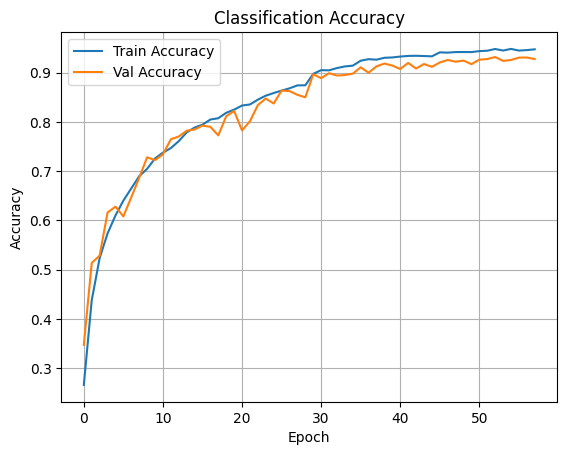

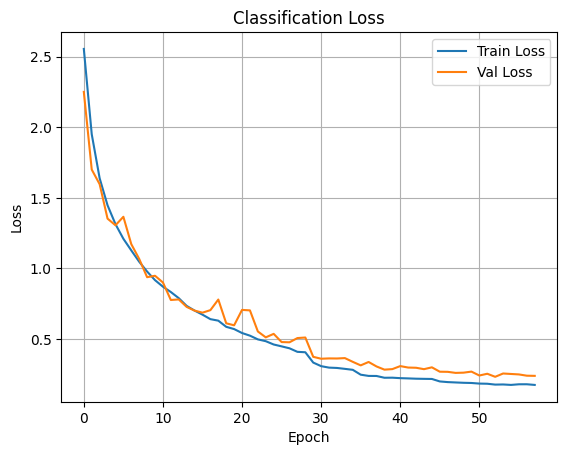

99/99 [==============================] - 8s 76ms/step


<Figure size 1200x1200 with 0 Axes>

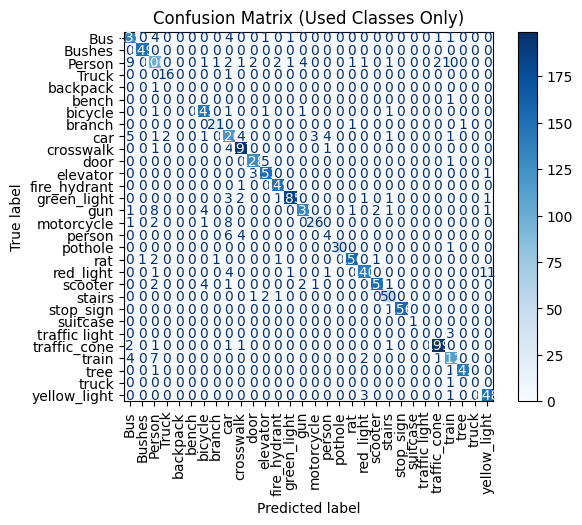


✅ Final Test Accuracy: 93.09%
📊 Precision: 92.96%
📊 Recall:    93.09%
📊 F1 Score:  92.96%


In [3]:
import os
import json
import random
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import warnings
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, precision_score, recall_score, f1_score
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Optional: Suppress TF warnings
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
warnings.filterwarnings("ignore")

# Seed for reproducibility
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# Set paths
BASE_DIR = r"C:\Users\rushi\Downloads\Balanced_Object_Detection_Dataset"
TRAIN_JSON = os.path.join(BASE_DIR, "annotations_train.json")
VALID_JSON = os.path.join(BASE_DIR, "annotations_valid.json")
TEST_JSON = os.path.join(BASE_DIR, "annotations_test.json")
TRAIN_DIR = os.path.join(BASE_DIR, "new_train")
VALID_DIR = os.path.join(BASE_DIR, "new_valid")
TEST_DIR = os.path.join(BASE_DIR, "new_test")

# Load COCO-style annotations
def load_coco(json_path):
    with open(json_path, 'r') as f:
        data = json.load(f)
    images = {img['id']: img for img in data['images']}
    categories = {cat['id']: cat['name'] for cat in data['categories']}
    ann_map = {}
    for ann in data['annotations']:
        img_id = ann['image_id']
        bbox = ann['bbox']
        cat_id = ann['category_id']
        if img_id not in ann_map:
            ann_map[img_id] = []
        ann_map[img_id].append((bbox, cat_id))
    return images, categories, ann_map

train_images, categories, train_anns = load_coco(TRAIN_JSON)
valid_images, _, valid_anns = load_coco(VALID_JSON)
test_images, _, test_anns = load_coco(TEST_JSON)

IMG_SIZE = 224
BATCH_SIZE = 32
NUM_CLASSES = len(categories)
category_id_to_index = {cat_id: idx for idx, cat_id in enumerate(sorted(categories.keys()))}

# Data generator
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_ids, image_dir, image_map, ann_map, batch_size, shuffle=True):
        self.image_ids = list(image_ids)
        self.image_dir = image_dir
        self.image_map = image_map
        self.ann_map = ann_map
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return len(self.image_ids) // self.batch_size

    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.image_ids)

    def __getitem__(self, idx):
        batch_ids = self.image_ids[idx * self.batch_size:(idx + 1) * self.batch_size]
        images, bboxes, labels = [], [], []
        for img_id in batch_ids:
            img_info = self.image_map[img_id]
            img_path = os.path.join(self.image_dir, img_info['file_name'])
            image = cv2.imread(img_path)
            image = cv2.resize(image, (IMG_SIZE, IMG_SIZE)) / 255.0
            ann_list = self.ann_map[img_id]
            bbox, cat_id = random.choice(ann_list)
            x, y, w, h = bbox
            bbox_scaled = [x / img_info['width'], y / img_info['height'],
                           w / img_info['width'], h / img_info['height']]
            label_idx = category_id_to_index[cat_id]
            images.append(image)
            bboxes.append(bbox_scaled)
            labels.append(tf.keras.utils.to_categorical(label_idx, NUM_CLASSES))
        return np.array(images), [np.array(bboxes), np.array(labels)]

# Model
input_layer = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = layers.Conv2D(32, 3, activation='relu', padding='same')(input_layer)
x = layers.MaxPooling2D()(x)
x = layers.Conv2D(64, 3, activation='relu', padding='same')(x)
x = layers.MaxPooling2D()(x)
x = layers.Conv2D(128, 3, activation='relu', padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.MaxPooling2D()(x)
x = layers.Conv2D(256, 3, activation='relu', padding='same')(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.4)(x)

bbox_output = layers.Dense(4, activation='sigmoid', name='bbox')(x)
class_output = layers.Dense(NUM_CLASSES, activation='softmax', name='class')(x)

model = models.Model(inputs=input_layer, outputs=[bbox_output, class_output])
model.compile(optimizer='adam',
              loss={'bbox': 'mse', 'class': 'categorical_crossentropy'},
              metrics={'bbox': 'mse', 'class': 'accuracy'})

# Generators
train_gen = DataGenerator(train_anns.keys(), TRAIN_DIR, train_images, train_anns, BATCH_SIZE)
valid_gen = DataGenerator(valid_anns.keys(), VALID_DIR, valid_images, valid_anns, BATCH_SIZE)
test_gen = DataGenerator(test_anns.keys(), TEST_DIR, test_images, test_anns, BATCH_SIZE, shuffle=False)

# Training
callbacks = [
    EarlyStopping(monitor='val_class_accuracy', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_class_accuracy', patience=3, factor=0.5, min_lr=1e-6)
]

history = model.fit(train_gen,
                    validation_data=valid_gen,
                    epochs=75,
                    callbacks=callbacks)

# Plot accuracy and loss
plt.plot(history.history['class_accuracy'], label='Train Accuracy')
plt.plot(history.history['val_class_accuracy'], label='Val Accuracy')
plt.title('Classification Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

plt.plot(history.history['class_loss'], label='Train Loss')
plt.plot(history.history['val_class_loss'], label='Val Loss')
plt.title('Classification Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Evaluate predictions on test set
preds = model.predict(test_gen)
pred_classes = np.argmax(preds[1], axis=1)
true_classes = []
for img_id in list(test_anns.keys())[:len(pred_classes)]:
    cat_id = random.choice(test_anns[img_id])[1]  # Pick random label
    true_classes.append(category_id_to_index[cat_id])

# Confusion matrix
cm = confusion_matrix(true_classes, pred_classes)
used_labels = sorted(list(set(true_classes + list(pred_classes))))
used_category_names = [list(categories.values())[i] for i in used_labels]
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=used_category_names)
plt.figure(figsize=(12, 12))
disp.plot(xticks_rotation=90, cmap='Blues')
plt.title("Confusion Matrix (Used Classes Only)")
plt.show()

# Metrics
precision = precision_score(true_classes, pred_classes, average='weighted')
recall = recall_score(true_classes, pred_classes, average='weighted')
f1 = f1_score(true_classes, pred_classes, average='weighted')
test_accuracy = np.mean(np.array(true_classes) == pred_classes)

print("\n✅ Final Test Accuracy: {:.2f}%".format(test_accuracy * 100))
print("📊 Precision: {:.2f}%".format(precision * 100))
print("📊 Recall:    {:.2f}%".format(recall * 100))
print("📊 F1 Score:  {:.2f}%".format(f1 * 100))


In [4]:
...

# Save the model
model.save("object_detection_final_model.h5")
print("✅ Model saved as object_detection_model.h5")

✅ Model saved as object_detection_model.h5


1/1 [==============================] - 0s 73ms/step


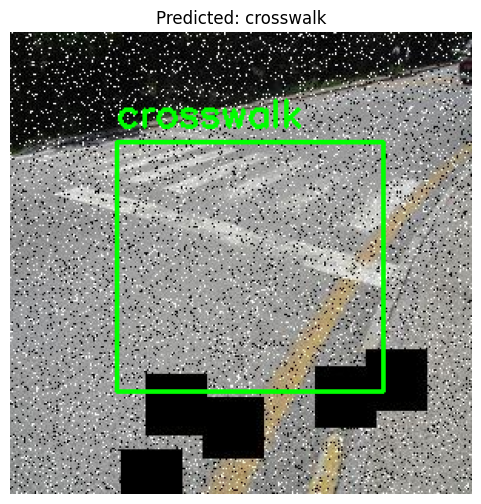

1/1 [==============================] - 0s 19ms/step


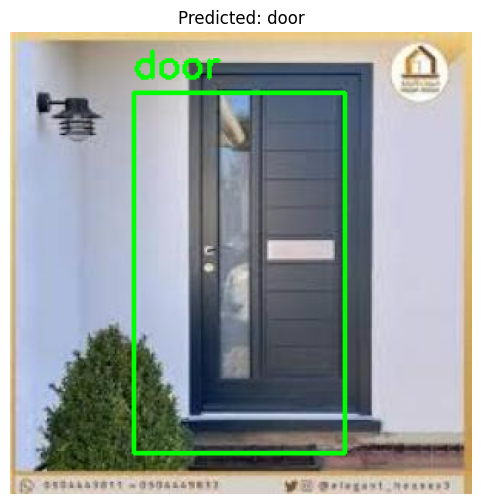

1/1 [==============================] - 0s 25ms/step


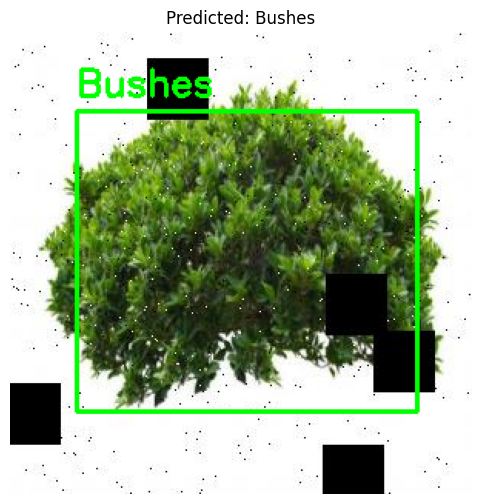

1/1 [==============================] - 0s 99ms/step


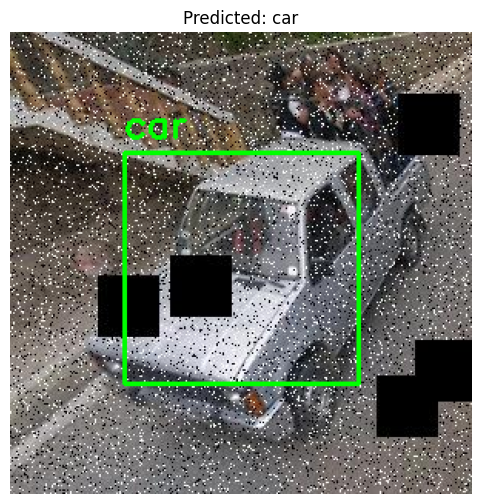

1/1 [==============================] - 0s 23ms/step


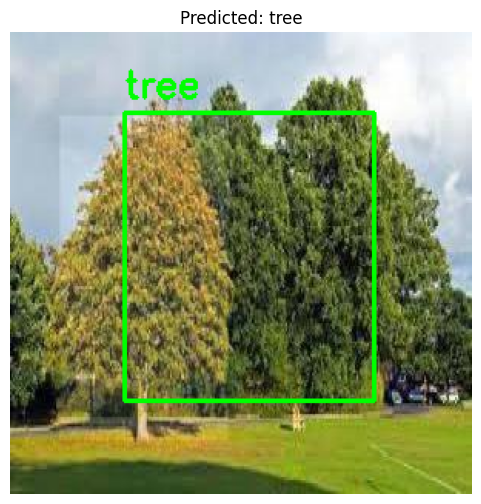

1/1 [==============================] - 0s 22ms/step


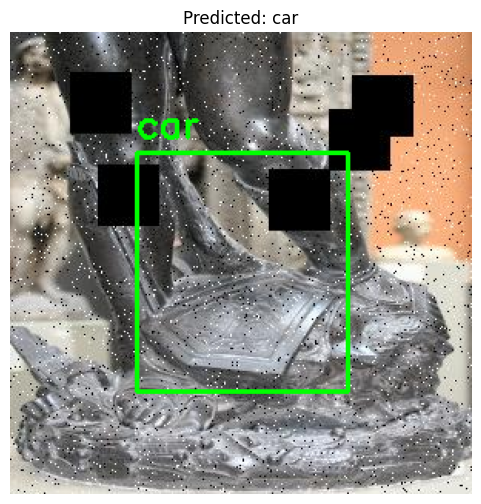

1/1 [==============================] - 0s 21ms/step


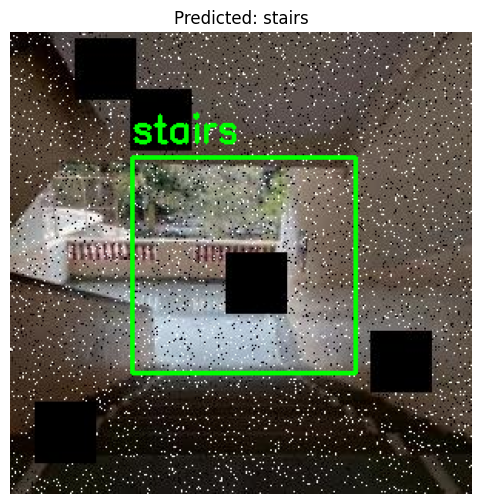

1/1 [==============================] - 0s 21ms/step


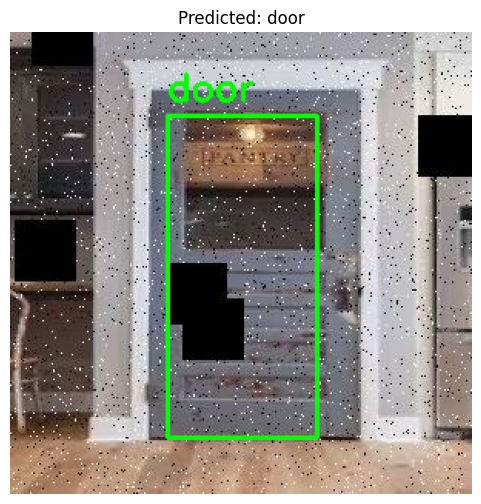

1/1 [==============================] - 0s 37ms/step


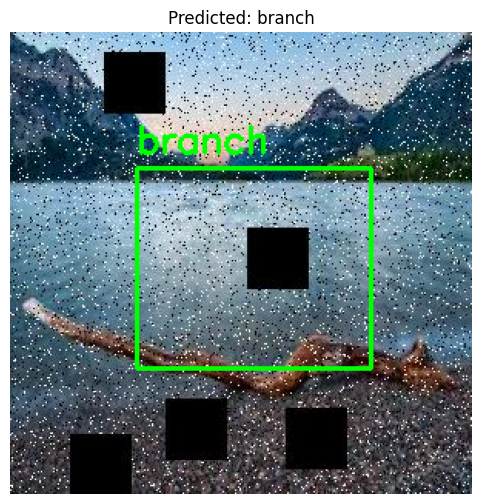

1/1 [==============================] - 0s 21ms/step


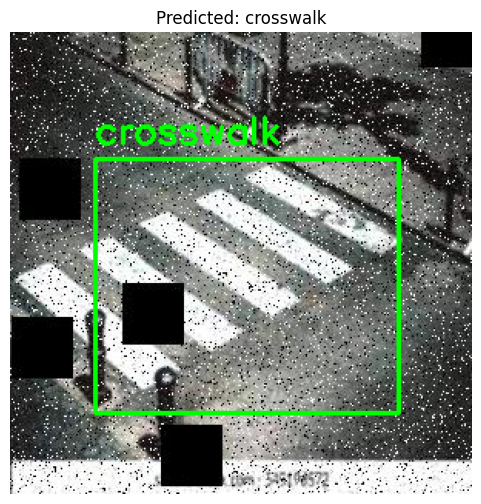

In [6]:
...

# Predict and visualize 10 random test images

def predict_and_visualize_multiple(n=10):
    model = tf.keras.models.load_model("object_detection_final_model.h5")

    for _ in range(n):
        random_img_id = random.choice(list(test_anns.keys()))
        img_info = test_images[random_img_id]
        img_path = os.path.join(TEST_DIR, img_info['file_name'])

        image = cv2.imread(img_path)
        image_resized = cv2.resize(image, (IMG_SIZE, IMG_SIZE)) / 255.0
        input_img = np.expand_dims(image_resized, axis=0)

        pred_bbox, pred_class = model.predict(input_img)
        pred_class_idx = np.argmax(pred_class[0])
        class_name = list(categories.values())[pred_class_idx]

        x, y, w, h = pred_bbox[0]
        x = int(x * img_info['width'])
        y = int(y * img_info['height'])
        w = int(w * img_info['width'])
        h = int(h * img_info['height'])

        image_bgr = cv2.imread(img_path)
        cv2.rectangle(image_bgr, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(image_bgr, class_name, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(6, 6))
        plt.imshow(image_rgb)
        plt.axis('off')
        plt.title(f"Predicted: {class_name}")
        plt.show()

predict_and_visualize_multiple(n=10)

1/1 [==============================] - 0s 72ms/step


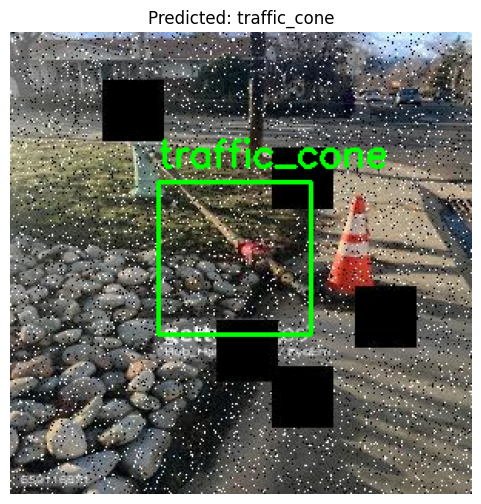

1/1 [==============================] - 0s 21ms/step


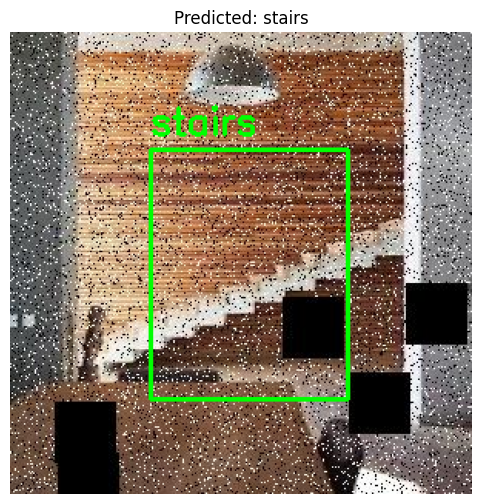

1/1 [==============================] - 0s 21ms/step


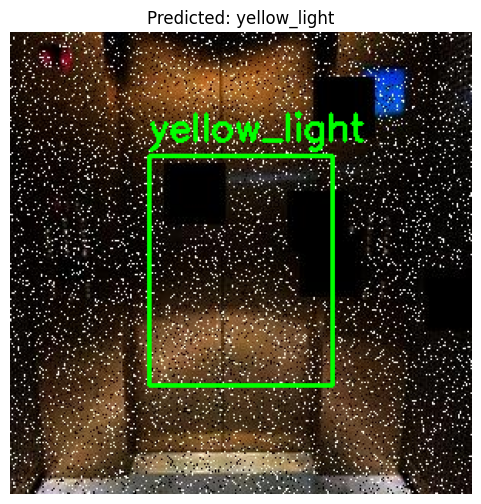

1/1 [==============================] - 0s 26ms/step


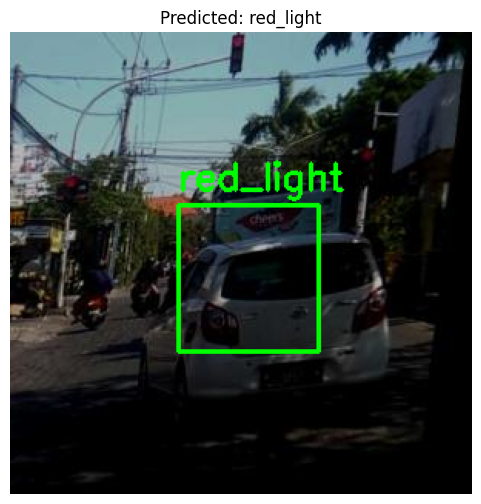

1/1 [==============================] - 0s 22ms/step


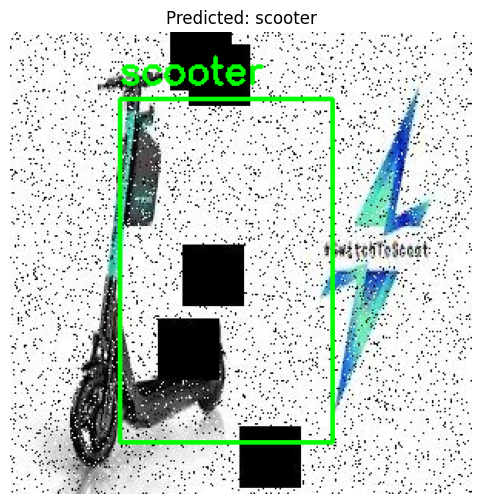

1/1 [==============================] - 0s 22ms/step


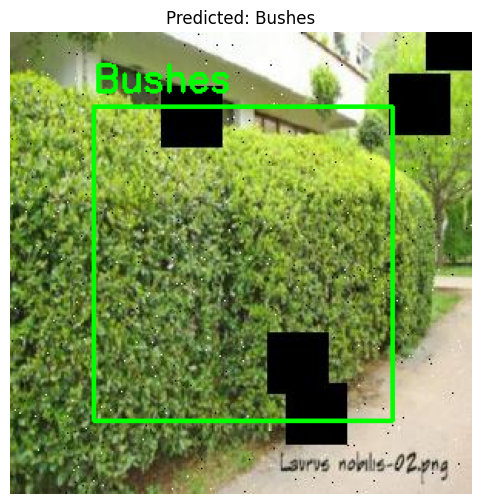

1/1 [==============================] - 0s 21ms/step


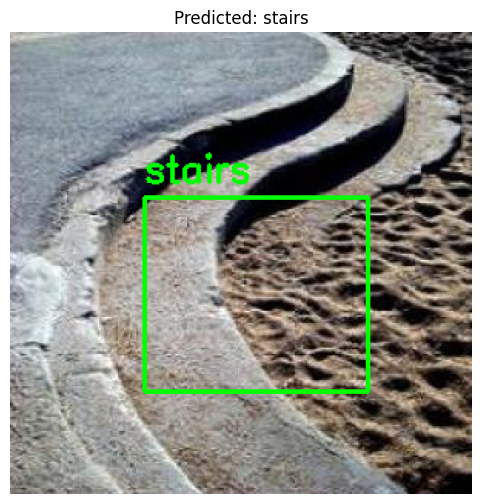

1/1 [==============================] - 0s 22ms/step


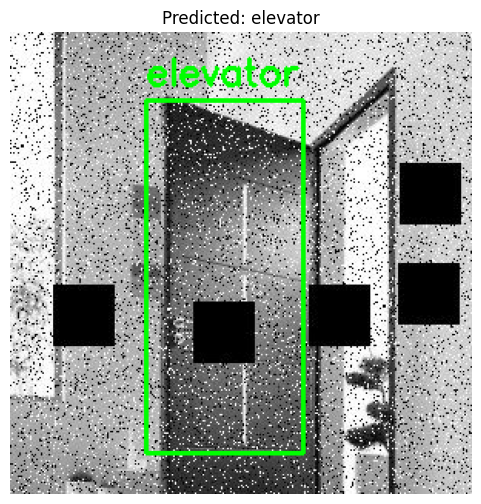

1/1 [==============================] - 0s 21ms/step


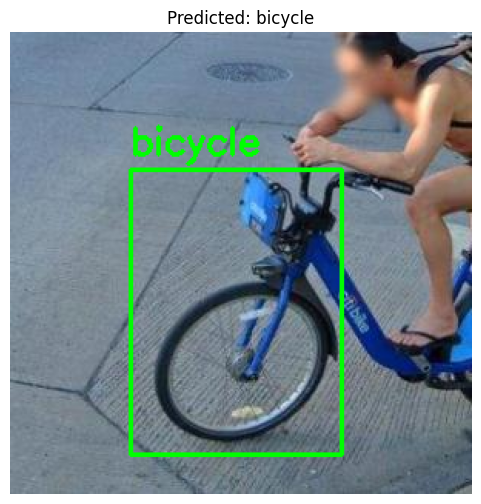

1/1 [==============================] - 0s 29ms/step


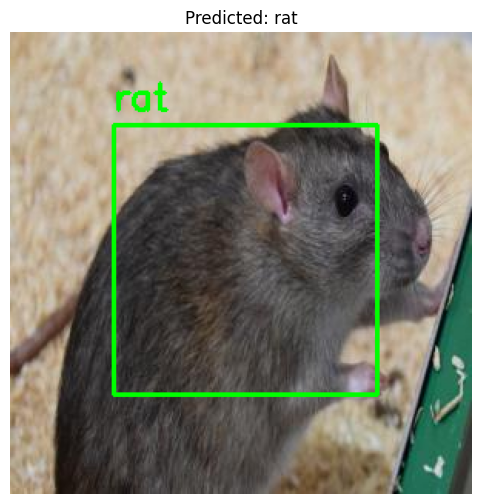

In [7]:
...

# Predict and visualize 10 random test images

def predict_and_visualize_multiple(n=10):
    model = tf.keras.models.load_model("object_detection_final_model.h5")

    for _ in range(n):
        random_img_id = random.choice(list(test_anns.keys()))
        img_info = test_images[random_img_id]
        img_path = os.path.join(TEST_DIR, img_info['file_name'])

        image = cv2.imread(img_path)
        image_resized = cv2.resize(image, (IMG_SIZE, IMG_SIZE)) / 255.0
        input_img = np.expand_dims(image_resized, axis=0)

        pred_bbox, pred_class = model.predict(input_img)
        pred_class_idx = np.argmax(pred_class[0])
        class_name = list(categories.values())[pred_class_idx]

        x, y, w, h = pred_bbox[0]
        x = int(x * img_info['width'])
        y = int(y * img_info['height'])
        w = int(w * img_info['width'])
        h = int(h * img_info['height'])

        image_bgr = cv2.imread(img_path)
        cv2.rectangle(image_bgr, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(image_bgr, class_name, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(6, 6))
        plt.imshow(image_rgb)
        plt.axis('off')
        plt.title(f"Predicted: {class_name}")
        plt.show()

predict_and_visualize_multiple(n=10)

1/1 [==============================] - 0s 67ms/step


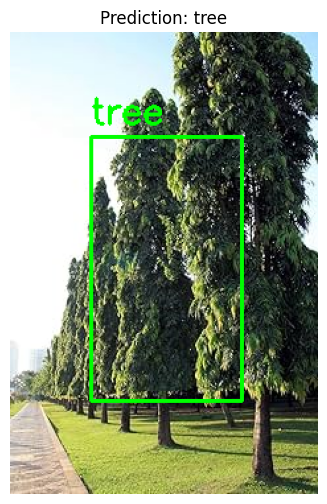

1/1 [==============================] - 0s 18ms/step


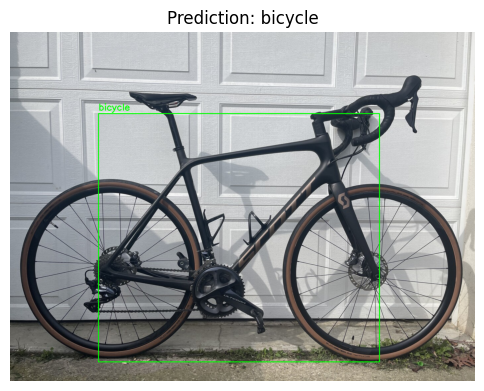

1/1 [==============================] - 0s 28ms/step


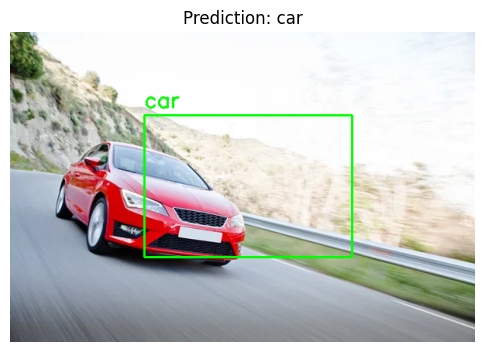

1/1 [==============================] - 0s 21ms/step


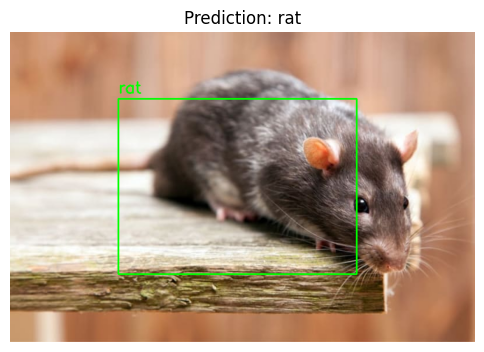

1/1 [==============================] - 0s 22ms/step


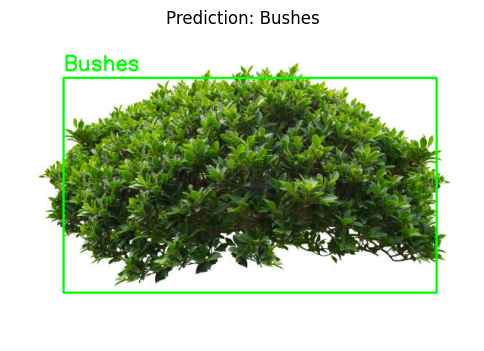

1/1 [==============================] - 0s 22ms/step


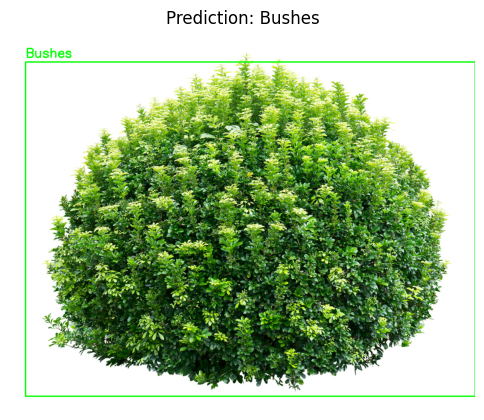

1/1 [==============================] - 0s 19ms/step


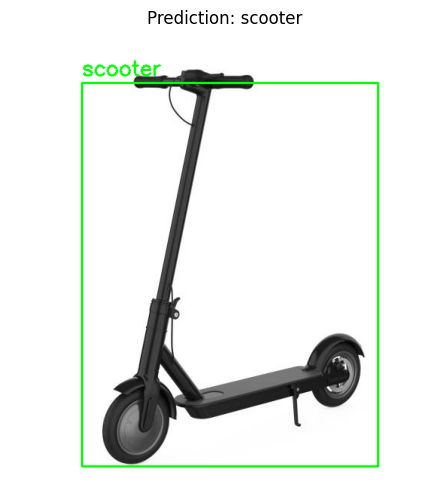

1/1 [==============================] - 0s 20ms/step


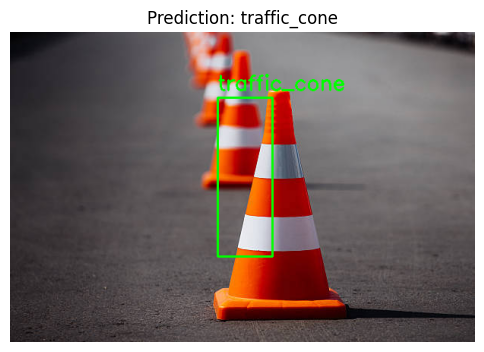

1/1 [==============================] - 0s 26ms/step


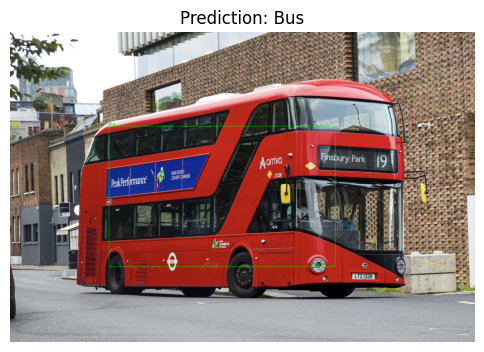

1/1 [==============================] - 0s 27ms/step


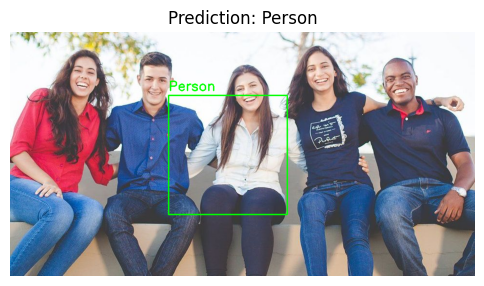

1/1 [==============================] - 0s 25ms/step


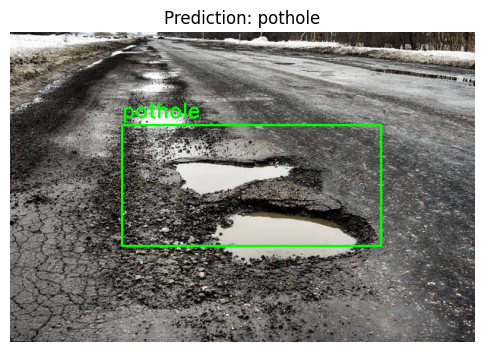

1/1 [==============================] - 0s 26ms/step


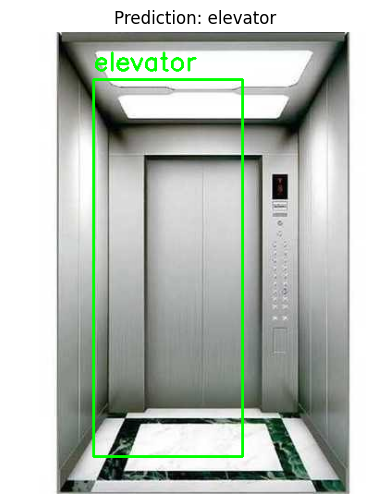

1/1 [==============================] - 0s 21ms/step


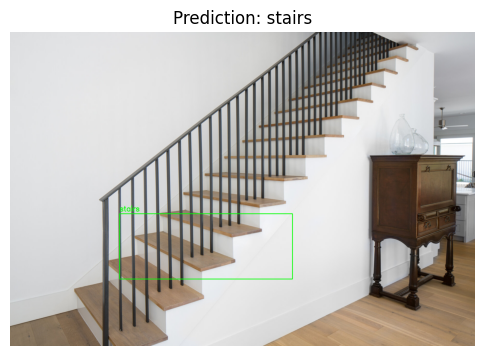

1/1 [==============================] - 0s 19ms/step


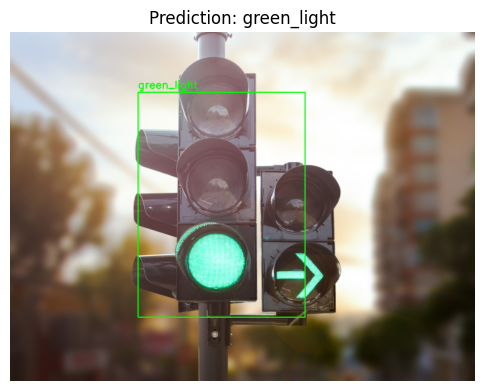

1/1 [==============================] - 0s 21ms/step


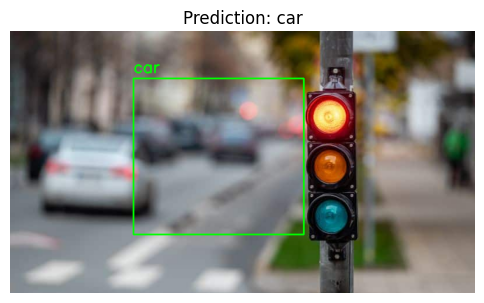

1/1 [==============================] - 0s 23ms/step


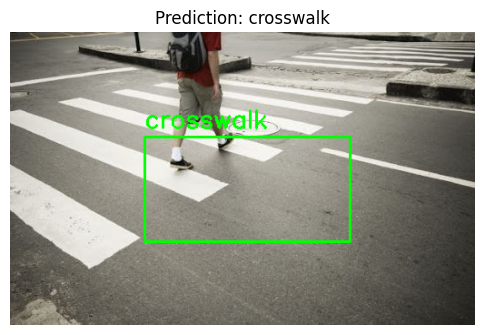

1/1 [==============================] - 0s 32ms/step


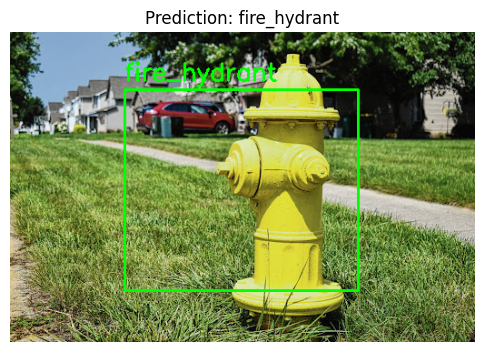

1/1 [==============================] - 0s 19ms/step


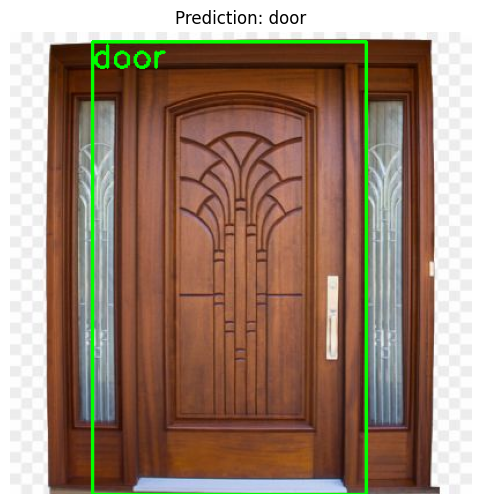

1/1 [==============================] - 0s 21ms/step


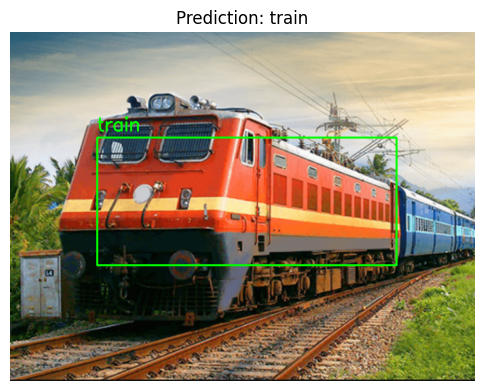

In [26]:
import glob
from tensorflow.keras.models import load_model

# Load the saved model
model = tf.keras.models.load_model("object_detection_final_model.h5")

# Path to folder containing external images
external_folder = r"C:\Users\rushi\OneDrive\Desktop\google_object_images"
image_paths = glob.glob(os.path.join(external_folder, "*.jpg")) + glob.glob(os.path.join(external_folder, "*.png"))

for path in image_paths:
    image_orig = cv2.imread(path)
    image_resized = cv2.resize(image_orig, (IMG_SIZE, IMG_SIZE)) / 255.0
    input_img = np.expand_dims(image_resized, axis=0)

    pred_bbox, pred_class = model.predict(input_img)
    pred_class_idx = np.argmax(pred_class[0])
    class_name = list(categories.values())[pred_class_idx]

    # Scale bbox to original image size
    h_orig, w_orig = image_orig.shape[:2]
    x, y, w, h = pred_bbox[0]
    x = int(x * w_orig)
    y = int(y * h_orig)
    w = int(w * w_orig)
    h = int(h * h_orig)

    # Draw prediction
    image_drawn = image_orig.copy()
    cv2.rectangle(image_drawn, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(image_drawn, class_name, (x, max(30, y - 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Display
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(image_drawn, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Prediction: {class_name}")
    plt.show()
